## Ironbark-1 mud gas plot using Plotly interactive subplots

Ironbark-1 is a petroleum exploration well drilled/ operated by BP Developments Australia Pty Ltd in the Dampier Sub-basin, offshore Western Australia.

The raw data includes petrophysical logs, mudgas and drilling parameters, and mudgas isotope analysis (from Isotubes).

All data is open-file and publicly available, and was downloaded from https://nopims.dmp.wa.gov.au/nopims

In [1]:
# Import the various modules required

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import lasio

In [2]:
# Function to read and clean log, mudgas and drill data

def read_data(logs_fname, mudgas_fname, drilldata_fname, isodata_fname, ethene_fname):
    global logs 
    logs = lasio.read(logs_fname).df()
    mudgas_raw = pd.read_csv(mudgas_fname)
    drilldata_raw = pd.read_csv(drilldata_fname)
    global mudgas 
    mudgas = mudgas_raw.replace(-999.25, np.NaN)
    global drilldata 
    drilldata = drilldata_raw.replace(-999.25, np.NaN)
    global isodata
    isodata = pd.read_csv(isodata_fname)
    global ethenedata
    ethenedata = pd.read_csv(ethene_fname)

In [3]:
# Read data files

read_data("Data/Ironbark-1_Well Composite_LWD_FNL_ARC_SADN_ADN_210107.las", 
          "Data/IRONBARK-1_GSS_DGAS_1583.0-5816.0m_TD.csv",
          "Data/IRONBARK-1_GSS_DDRL_201229_5618.0m_TD.csv", 
          "Data/Ironbark-1_Isotubes.csv", 
          "Data/Ironbark-1_ethene.csv")

In [4]:
# Reset log dataframe index

logs.reset_index(inplace=True)

In [5]:
# Calculate moving average for Weight on Bit log

drilldata['WOB_MA100'] = drilldata['Weight On Bit Driller (klbm)'].rolling(100).mean()

In [6]:
# Assign log, mudgas and drill data curves to variable names

Depth1 = logs['DEPT']
GR = logs['GR:1']

Depth2 = mudgas['Depth (m)']
TG = mudgas['Total Gas Out 1 (%)']
C1 = mudgas['ChromatographOut_1 C1 (ppm)'] / 10000    # convert ppm to %
C2 = mudgas['ChromatographOut_1 C2 (ppm)'] / 10000
C3 = mudgas['ChromatographOut_1 C3 (ppm)'] / 10000
iC4 = mudgas['ChromatographOut_1 iC4 (ppm)'] / 10000
nC4 = mudgas['ChromatographOut_1 nC4 (ppm)'] / 10000
iC5 = mudgas['ChromatographOut_1 iC5 (ppm)'] / 10000
nC5 = mudgas['ChromatographOut_1 nC5 (ppm)'] / 10000
CO2 = mudgas['CO2 Out1 (%)']
H2S = mudgas['H2S Out1 (ppm)']

Depth3 = drilldata['Depth (m)']
ROP = drilldata[' ROP (m/h)']
WOB = drilldata['Weight On Bit Driller (klbm)']
WOB_MA = drilldata['WOB_MA100']
MW_IN = drilldata['Mud Weight In at Bit (g/cm3)']
MW_OUT = drilldata['Mud Weight Out (g/cm3)']

# Wetness and balance calculation

Wh = (C2+C3+iC4+nC4+iC5+nC5) / (C1+C2+C3+iC4+nC4+iC5+nC5) * 100
Bh = (C1+C2) / (C3+iC4+nC4+iC5+nC5)

# Assign isotope data to variable names

Depth4 = isodata['Depth (m)']
delta13C_C1 = isodata["delta13C-C1"] 
delta13C_C2 = isodata["delta13C-C2"]
delta13C_C3 = isodata["delta13C-C3"]

# Assign ethene ratio to variable name

Depth5 = ethenedata['Depth (m)']
Ethene_ratio = ethenedata['Ethene/Ethene+Ethane']

In [7]:
# Create dictionary of formation names, top and base depth from Isotubes inventory (note: Isotube sample depths used, 
# may not correspond exactly to formation top/base depths)

formations = {'BARE':[1590, 1890],
              'TREA':[1920, 2010],
              'MAND':[2040, 2310],
              'WALC':[2340, 2460],
              'WILC':[2490, 2550],
              'DOCK/LAMB':[2580, 2640],
              'MIRA':[2670, 2700],
              'WITH':[2730, 2760],
              'TOOL':[2790, 2850],
              'HAYC':[2880, 2910],
              'WIND':[2940, 2970],
              'MUDE':[2970, 3000],
              'FORE':[3000, 3030],
              'LEGD':[3030, 3120],
              'ATHL':[3150, 3480],
              'MURT':[3510, 3540],
              'NRAN':[3570, 3630],
              'BRIG':[3660, 3930],
              'uprMUNG':[3960, 4230],
              'midMUNG':[4260, 5270],
              'lwrMUNG':[5280, 5618],
              'TD':[5618, 5618]}

# Create lists of formations, top depths and x plot values

formation = []
top_depth = []
formations_x = []

for key, value in formations.items():
    formation.append(key)
    top_depth.append(value[0])
    formations_x.append(300)    # x plot value of 300 (max of GR axis)
    
# Create dataframe of formation data

formations_df = pd.DataFrame(
    {'Top Depth (m)':top_depth,
     'Formation Top':formation,
     'Formation_x':formations_x})    

# Assign formation data to variable names

Fm_depth = formations_df['Top Depth (m)']
Fm_name = formations_df['Formation Top']
Fm_x = formations_df['Formation_x']

In [8]:
# Chromatographic breakdown of selected gas peaks

depths_of_interest = [3983.0, 5113.0, 5481.0, 5561.0]
mudgas_sel = []

# Loop over mudgas dataframe to create list of mudgas data from depths of interest

for depth in depths_of_interest:
    mudgas_sel.append(mudgas[mudgas['Depth (m)'] == depth])

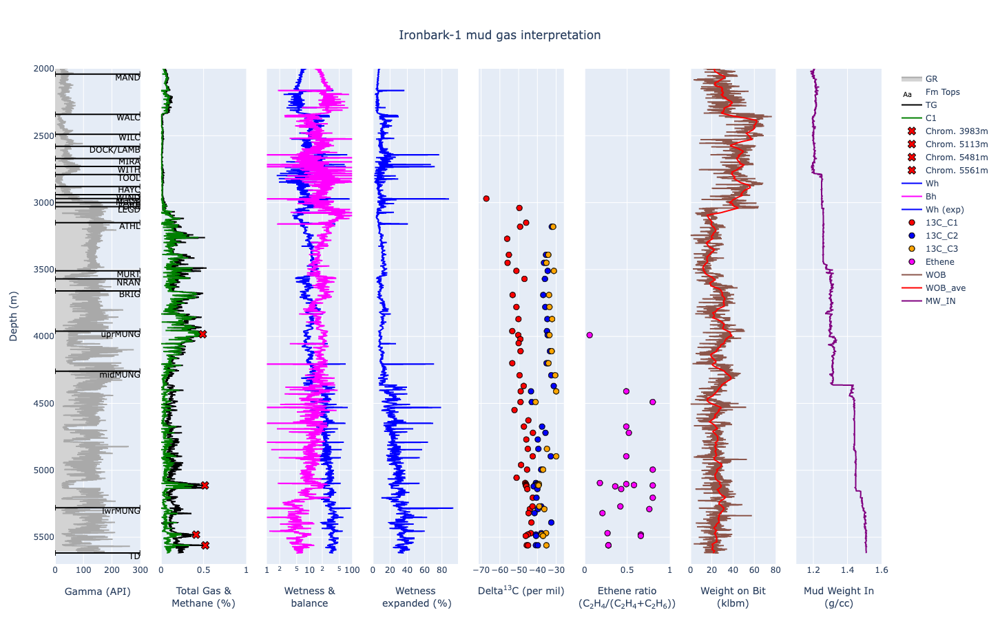

In [9]:
# Configure and display plot with Plotly make_subplots()

fig = make_subplots(rows=1, cols=8, shared_yaxes=True)

# Gamma ray with color fill

fig.add_trace(go.Scatter(x=GR, y=Depth1, 
                         name='GR',
                         line=dict(color='darkgrey'),
                         fill='tozerox',
                         fillcolor = 'lightgrey'),
              row=1, col=1)

fig.add_trace(go.Scatter(x=Fm_x, y=Fm_depth, 
                         name='Fm Tops', 
                         line=dict(color='black'), 
                         mode='text', 
                         error_x=dict(type='constant', 
                                      symmetric=False, 
                                      value=0, valueminus=300, 
                                      color='black'), 
                         text=Fm_name, 
                         textposition='bottom left', 
                         textfont=dict(color='black')), 
              row=1, col=1)

fig.add_trace(go.Scatter(x=TG, y=Depth2, 
                         name='TG', 
                         line=dict(color='black')), 
              row=1, col=2)

fig.add_trace(go.Scatter(x=C1, y=Depth2, 
                         name='C1', 
                         line=dict(color='green')), 
              row=1, col=2)

for i in range(len(mudgas_sel)):
    fig.add_trace(go.Scatter(x=mudgas_sel[i]['Total Gas Out 1 (%)'], y=mudgas_sel[i]['Depth (m)'],
                             name=f'Chrom. {int(mudgas_sel[i].iloc[0,0])}m', 
                             line=dict(color='black'),
                             mode='markers',
                             marker=dict(size=10,
                                         line=dict(width=1),
                                         color='red',
                                         symbol='x')),
                  row=1, col=2)

fig.add_trace(go.Scatter(x=Wh, y=Depth2, 
                         name='Wh', 
                         line=dict(color='blue')), 
              row=1, col=3)

fig.add_trace(go.Scatter(x=Bh, y=Depth2, 
                         name='Bh', 
                         line=dict(color='magenta')), 
              row=1, col=3)

fig.add_trace(go.Scatter(x=Wh, y=Depth2, 
                         name='Wh (exp)', 
                         line=dict(color='blue')), 
              row=1, col=4)

fig.add_trace(go.Scatter(x=delta13C_C1, y=Depth4, 
                         name='13C_C1', 
                         line=dict(color='black'), 
                         mode='markers',
                         marker=dict(size=8, 
                                     line=dict(width=1), 
                                     color='red')), 
              row=1, col=5)

fig.add_trace(go.Scatter(x=delta13C_C2, y=Depth4, 
                         name='13C_C2', 
                         line=dict(color='black'),
                         mode='markers',
                         marker=dict(size=8, 
                                     line=dict(width=1), 
                                     color='blue')), 
              row=1, col=5)

fig.add_trace(go.Scatter(x=delta13C_C3, y=Depth4, 
                         name='13C_C3', 
                         line=dict(color='black'), 
                         mode='markers',
                         marker=dict(size=8, 
                                     line=dict(width=1), 
                                     color='orange')), 
              row=1, col=5)

fig.add_trace(go.Scatter(x=Ethene_ratio, y=Depth5, 
                         name='Ethene', 
                         line=dict(color='black'), 
                         mode='markers',
                         marker=dict(size=8, 
                                     line=dict(width=1), 
                                     color='magenta')), 
              row=1, col=6)

fig.add_trace(go.Scatter(x=WOB, y=Depth3, 
                         name='WOB', 
                         line=dict(color='#8c564b')), 
              row=1, col=7)

fig.add_trace(go.Scatter(x=WOB_MA, y=Depth3, 
                         name='WOB_ave', 
                         line=dict(color='red')), 
              row=1, col=7)

fig.add_trace(go.Scatter(x=MW_IN, y=Depth3, 
                         name='MW_IN', 
                         line=dict(color='purple')), 
              row=1, col=8)

fig.update_xaxes(title=dict(text='Gamma (API)',
                            standoff=20),
                 row=1, col=1,
                 range=[0, 300])

fig.update_xaxes(title=dict(text='Total Gas &<br>Methane (%)',
                            standoff=0),
                 row=1, col=2, 
                 range=[0, 1])

fig.update_xaxes(title=dict(text='Wetness &<br>balance',
                            standoff=0),
                 type='log', 
                 row=1, col=3, 
                 range=[0, 2])


fig.update_xaxes(title=dict(text='Wetness<br> expanded (%)',
                            standoff=0),
                 row=1, col=4)

fig.update_xaxes(title=dict(text='Delta<sup>13</sup>C (per mil)<br>',
                            standoff=0),
                 row=1, col=5)

fig.update_xaxes(title=dict(text='Ethene ratio<br>(C<sub>2</sub>H<sub>4</sub>/(C<sub>2</sub>H<sub>4</sub>+C<sub>2</sub>H<sub>6</sub>))',
                            standoff=0),
                 row=1, col=6, 
                 range=[0, 1])

fig.update_xaxes(title=dict(text='Weight on Bit<br>(klbm)',
                            standoff=0),
                 row=1, col=7, 
                 range=[0, 80])

fig.update_xaxes(title=dict(text='Mud Weight In<br>(g/cc)',
                            standoff=0),
                 row=1, col=8, 
                 range=[1.1, 1.6])

fig.update_yaxes(title_text='Depth (m)',
                 row=1, col=1, 
                 range=[5700, 2000])

fig.update_layout(template='plotly',
                  height=900, 
                  title={'text':'Ironbark-1 mud gas interpretation',
                         'y':0.95,
                         'x':0.5,                         
                         'xanchor':'center',                         
                         'yanchor':'top'})
                  
fig.show()
fig.write_html("Ironbark-1_mud_gas_plot_interactive.html", 
               include_plotlyjs='cdn')

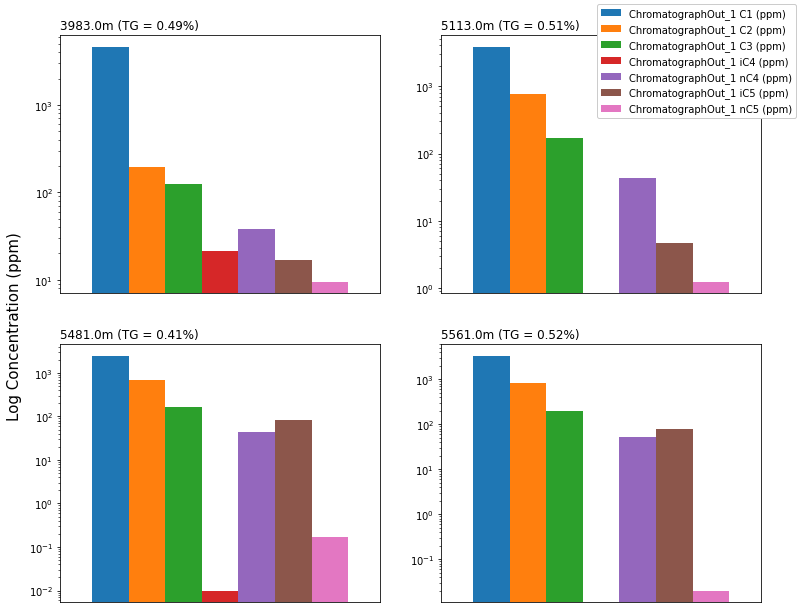

In [10]:
# Plot chromatigraphic breakdown of selected gas peaks

fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(11, 9))
plt.tight_layout(pad=3)
plt.setp(plt.gcf().get_axes(), yscale=('log'))

mudgas_sel[0].iloc[:,2:9].plot.bar(ax=ax[0,0], width=2, legend=None,
                       xticks=[], xlabel='')
mudgas_sel[1].iloc[:,2:9].plot.bar(ax=ax[0,1], width=2, legend=None,
                       xticks=[], xlabel='')
mudgas_sel[2].iloc[:,2:9].plot.bar(ax=ax[1,0], width=2, legend=None,
                       xticks=[], xlabel='')
mudgas_sel[3].iloc[:,2:9].plot.bar(ax=ax[1,1], width=2, legend=None,
                       xticks=[], xlabel='')

# Plot titles

ax[0,0].set_title(str(mudgas_sel[0].iloc[0,0]) + 'm' + ' (TG = {:.2f}%)'.format(mudgas_sel[0].iloc[0,1]),
                  size=12, loc='left')
ax[0,1].set_title(str(mudgas_sel[1].iloc[0,0]) + 'm' + ' (TG = {:.2f}%)'.format(mudgas_sel[1].iloc[0,1]), 
                  size=12, loc='left')
ax[1,0].set_title(str(mudgas_sel[2].iloc[0,0]) + 'm' + ' (TG = {:.2f}%)'.format(mudgas_sel[2].iloc[0,1]), 
                  size=12, loc='left')
ax[1,1].set_title(str(mudgas_sel[3].iloc[0,0]) + 'm' + ' (TG = {:.2f}%)'.format(mudgas_sel[3].iloc[0,1]), 
                  size=12, loc='left')
# Y-axis label

fig.text(0, 0.5, 'Log Concentration (ppm)', size=15,
         va='center', rotation='vertical')

# Legend

handles, labels = ax[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', framealpha=1)

plt.savefig("Data/Ironbark-1_mud_gas_chromat_brkdwn.png")
plt.show()